# Congress Members Trading Network Creation

In [2]:
import requests
import os
import pandas as pd
from dotenv import load_dotenv
import networkx as nx
import matplotlib.pyplot as plt

### Load trades (48'479 in total)

In [37]:
load_dotenv()

api_key = os.getenv("QUIVER_API_KEY")

url = "https://api.quiverquant.com/beta/bulk/congresstrading"
querystring = {"page_size": "100000"}

headers = {"Accept": "application/json", "Authorization": f"Bearer {api_key}"}

response = requests.get(url, headers=headers, params=querystring)

if response.status_code == 200:
    data = response.json()

    df = pd.DataFrame(data)

    df.to_csv("../data/external/congress_trading_data_quiver.csv", index=False)
    print("Data saved to congress_trading_data_quiver.csv")
else:
    print(f"Error: {response.status_code}")

Data saved to congress_trading_data.csv


#### Dataframe preprocessing

In [38]:
# Load the data from CSV
df = pd.read_csv("../data/external/congress_trading_data_quiver.csv")

# Convert the TransactionDate to datetime format for date comparisons
df["TransactionDate"] = pd.to_datetime(df["TransactionDate"])

# Standardize transaction types
df["Transaction"] = df["Transaction"].replace({"Sale (Partial)": "Sale", "Sale (Full)": "Sale"})

## 

### Create networks

#### All Congress members

##### 14 days

GML file saved as data/internal/networks/all_members_14days.gml


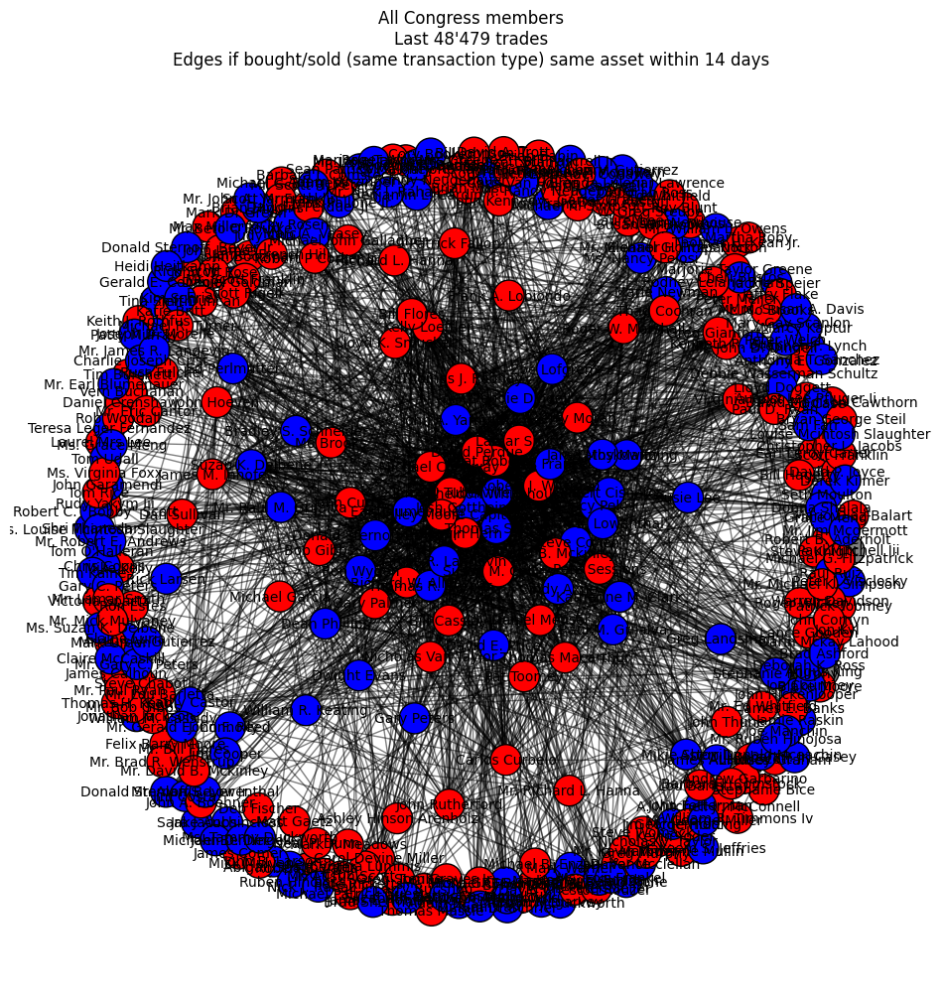

In [39]:
# Create a graph
G = nx.Graph()

# Map members to their parties (D = democrats, R = Republicans)
party_colors = {"D": "blue", "R": "red"}
party_map = {row["Representative"]: row["Party"] for _, row in df.iterrows()}

# Add nodes for each unique representative with party color
for rep in df["Representative"].unique():
    G.add_node(
        rep, color=party_colors.get(party_map[rep], "gray")
    )  # Default to gray if party unknown

# Create edges for representatives who made trades (same transaction type) on same asset within certain time period
for ticker in df["Ticker"].unique():
    # Filter rows for the current ticker
    ticker_trades = df[df["Ticker"] == ticker]

    # Loop through each pair of representatives who traded this stock
    for i in range(len(ticker_trades)):
        for j in range(i + 1, len(ticker_trades)):
            rep1 = ticker_trades.iloc[i]["Representative"]
            rep2 = ticker_trades.iloc[j]["Representative"]
            date1 = ticker_trades.iloc[i]["TransactionDate"]
            date2 = ticker_trades.iloc[j]["TransactionDate"]
            trans_type1 = ticker_trades.iloc[i]["Transaction"]
            trans_type2 = ticker_trades.iloc[j]["Transaction"]

            # Check if the trades are within the specified period, avoid self-loops, and match transaction types
            if rep1 != rep2 and abs((date1 - date2).days) <= 14 and trans_type1 == trans_type2:
                G.add_edge(rep1, rep2, stock=ticker)

# Export the graph to a GML file
folder = "data/internal/networks"
os.makedirs(folder, exist_ok=True)
filename = "all_members_14days.gml"
nx.write_gml(G, f"../{folder}/{filename}")
print(f"GML file saved as {folder}/{filename}")

# Draw the graph
plt.figure(figsize=(12, 12))

# Use spring layout for better visualization
pos = nx.spring_layout(G, seed=42, k=1.5)

# Get node colors based on party
node_colors = [data["color"] for _, data in G.nodes(data=True)]

# Draw nodes and edges with color based on party
nx.draw_networkx_nodes(G, pos, node_size=500, node_color=node_colors, edgecolors="black")
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=10, font_family="sans-serif")

# Display the plot
plt.title(
    "All Congress members\nLast 48'479 trades\nEdges if bought/sold (same transaction type) same asset within 14 days"
)
plt.axis("off")
plt.show()

##### 7 days

GML file saved as data/internal/networks/all_members_7days.gml


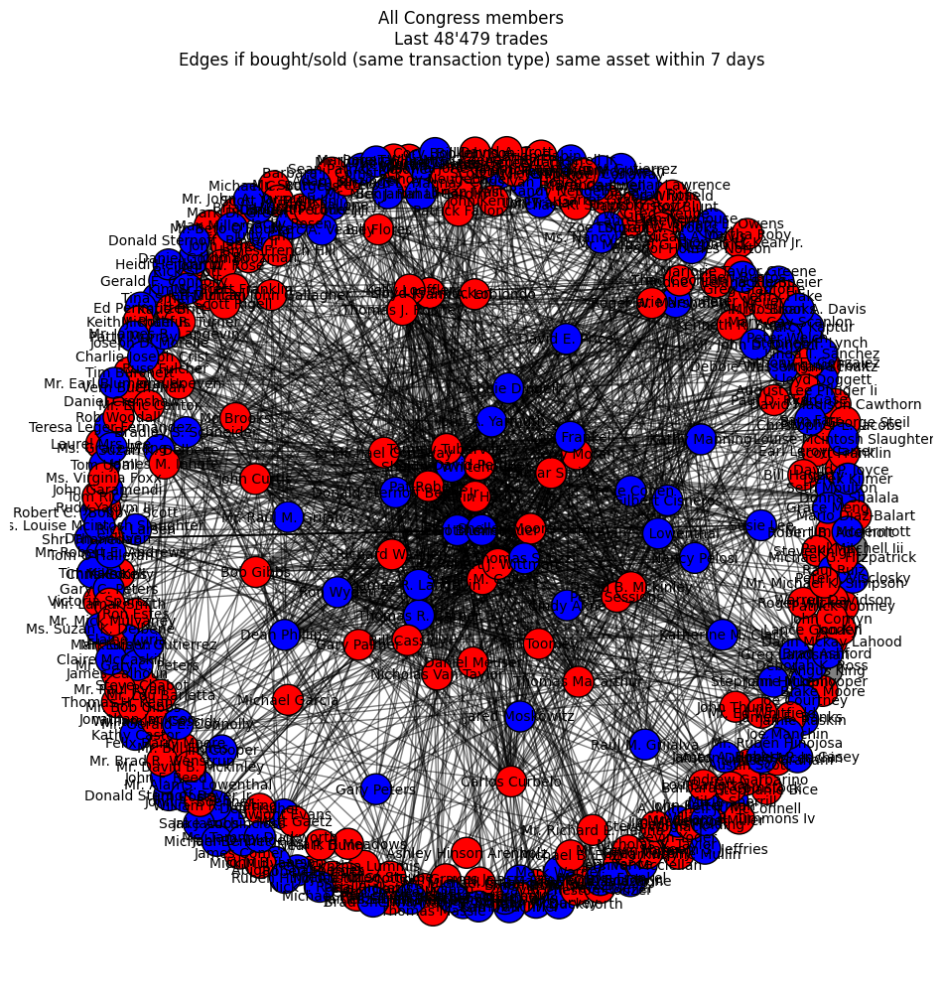

In [40]:
# Create a graph
G = nx.Graph()

# Map members to their parties (D = democrats, R = Republicans)
party_colors = {"D": "blue", "R": "red"}
party_map = {row["Representative"]: row["Party"] for _, row in df.iterrows()}

# Add nodes for each unique representative with party color
for rep in df["Representative"].unique():
    G.add_node(
        rep, color=party_colors.get(party_map[rep], "gray")
    )  # Default to gray if party unknown

# Create edges for representatives who made trades (same transaction type) on same asset within certain time period
for ticker in df["Ticker"].unique():
    # Filter rows for the current ticker
    ticker_trades = df[df["Ticker"] == ticker]

    # Loop through each pair of representatives who traded this stock
    for i in range(len(ticker_trades)):
        for j in range(i + 1, len(ticker_trades)):
            rep1 = ticker_trades.iloc[i]["Representative"]
            rep2 = ticker_trades.iloc[j]["Representative"]
            date1 = ticker_trades.iloc[i]["TransactionDate"]
            date2 = ticker_trades.iloc[j]["TransactionDate"]
            trans_type1 = ticker_trades.iloc[i]["Transaction"]
            trans_type2 = ticker_trades.iloc[j]["Transaction"]

            # Check if the trades are within the specified period, avoid self-loops, and match transaction types
            if rep1 != rep2 and abs((date1 - date2).days) <= 7 and trans_type1 == trans_type2:
                G.add_edge(rep1, rep2, stock=ticker)

# Export the graph to a GML file
folder = "data/internal/networks"
os.makedirs(folder, exist_ok=True)
filename = "all_members_7days.gml"
nx.write_gml(G, f"../{folder}/{filename}")
print(f"GML file saved as {folder}/{filename}")

# Draw the graph
plt.figure(figsize=(12, 12))

# Use spring layout for better visualization
pos = nx.spring_layout(G, seed=42, k=1.5)

# Get node colors based on party
node_colors = [data["color"] for _, data in G.nodes(data=True)]

# Draw nodes and edges with color based on party
nx.draw_networkx_nodes(G, pos, node_size=500, node_color=node_colors, edgecolors="black")
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=10, font_family="sans-serif")

# Display the plot
plt.title(
    "All Congress members\nLast 48'479 trades\nEdges if bought/sold (same transaction type) same asset within 7 days"
)
plt.axis("off")
plt.show()

##### 1 day

GML file saved as data/internal/networks/all_members_1day.gml


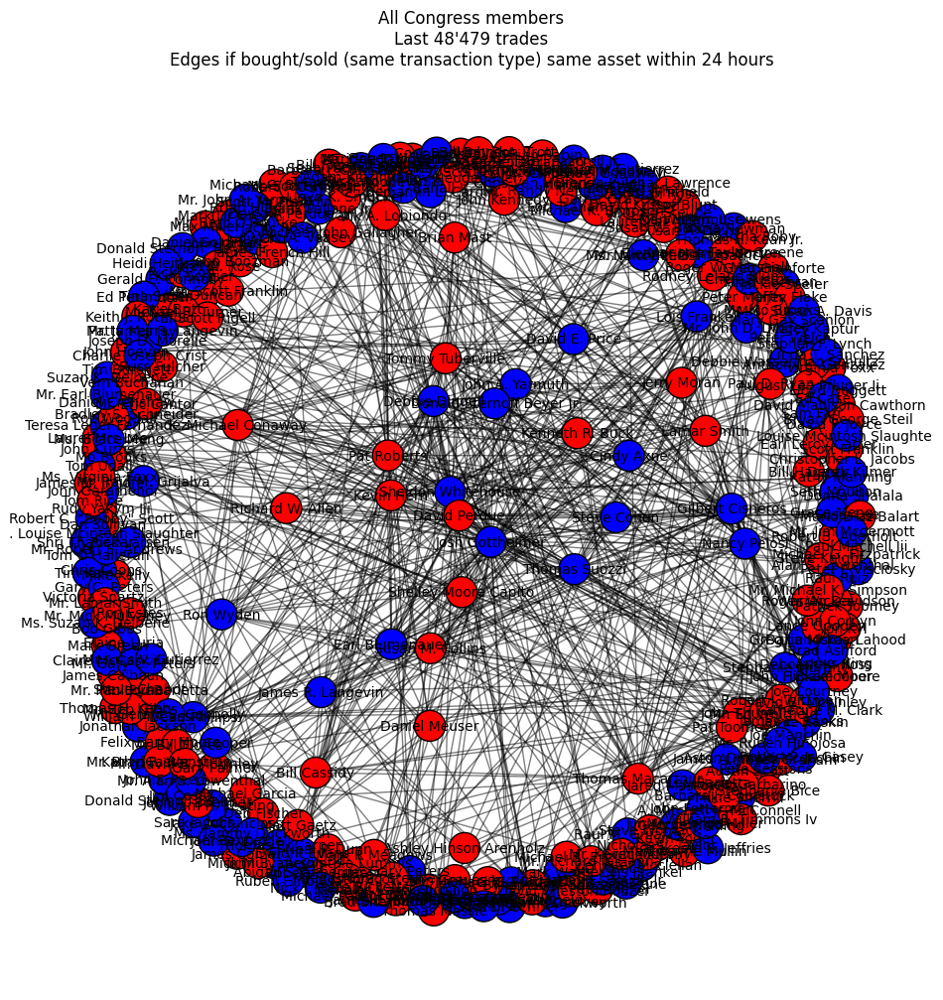

In [41]:
# Create a graph
G = nx.Graph()

# Map members to their parties (D = democrats, R = Republicans)
party_colors = {"D": "blue", "R": "red"}
party_map = {row["Representative"]: row["Party"] for _, row in df.iterrows()}

# Add nodes for each unique representative with party color
for rep in df["Representative"].unique():
    G.add_node(
        rep, color=party_colors.get(party_map[rep], "gray")
    )  # Default to gray if party unknown

# Create edges for representatives who made trades (same transaction type) on same asset within certain time period
for ticker in df["Ticker"].unique():
    # Filter rows for the current ticker
    ticker_trades = df[df["Ticker"] == ticker]

    # Loop through each pair of representatives who traded this stock
    for i in range(len(ticker_trades)):
        for j in range(i + 1, len(ticker_trades)):
            rep1 = ticker_trades.iloc[i]["Representative"]
            rep2 = ticker_trades.iloc[j]["Representative"]
            date1 = ticker_trades.iloc[i]["TransactionDate"]
            date2 = ticker_trades.iloc[j]["TransactionDate"]
            trans_type1 = ticker_trades.iloc[i]["Transaction"]
            trans_type2 = ticker_trades.iloc[j]["Transaction"]

            # Check if the trades are within the specified period, avoid self-loops, and match transaction types
            if rep1 != rep2 and abs((date1 - date2).days) <= 1 and trans_type1 == trans_type2:
                G.add_edge(rep1, rep2, stock=ticker)

# Export the graph to a GML file
folder = "data/internal/networks"
os.makedirs(folder, exist_ok=True)
filename = "all_members_1day.gml"
nx.write_gml(G, f"../{folder}/{filename}")
print(f"GML file saved as {folder}/{filename}")

# Draw the graph
plt.figure(figsize=(12, 12))

# Use spring layout for better visualization
pos = nx.spring_layout(G, seed=42, k=1.5)

# Get node colors based on party
node_colors = [data["color"] for _, data in G.nodes(data=True)]

# Draw nodes and edges with color based on party
nx.draw_networkx_nodes(G, pos, node_size=500, node_color=node_colors, edgecolors="black")
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=10, font_family="sans-serif")

# Display the plot
plt.title(
    "All Congress members\nLast 48'479 trades\nEdges if bought/sold (same transaction type) same asset within 24 hours"
)
plt.axis("off")
plt.show()

#### Democrat vs Republican

##### 14 days

GML file saved as data/internal/networks/republican_members_14days.gml


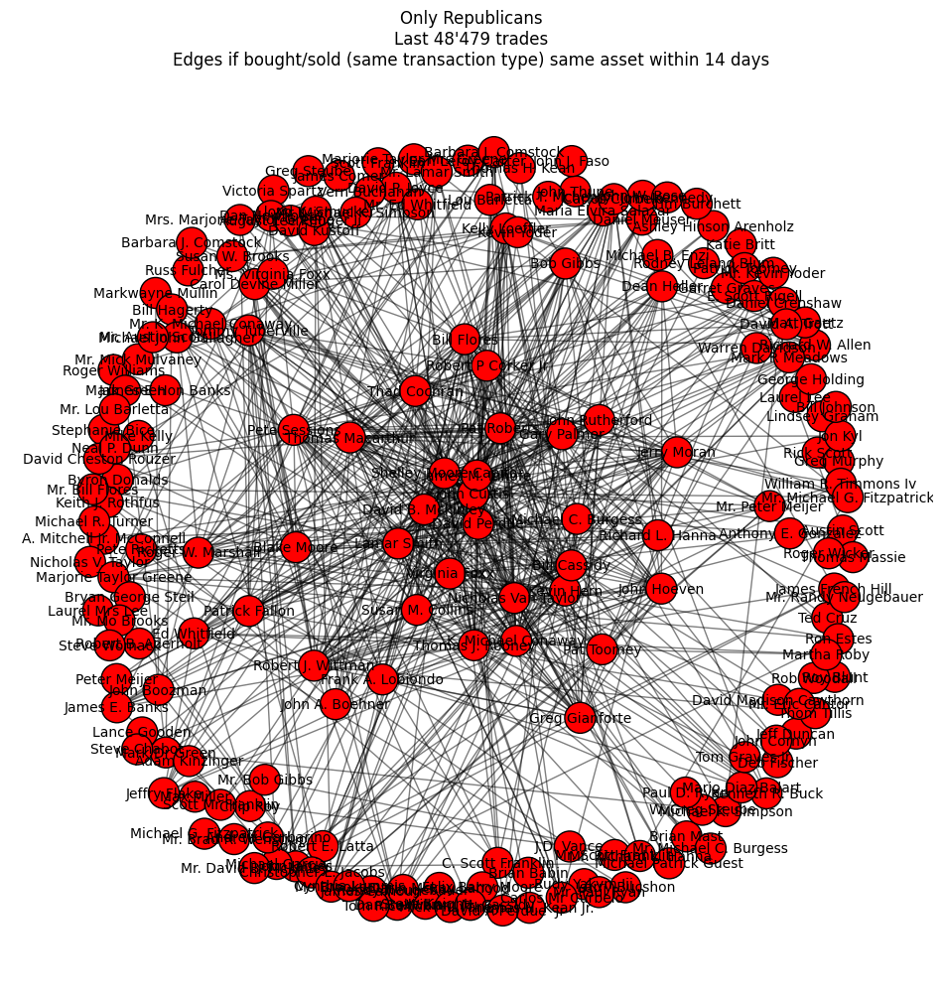

In [42]:
# Create a graph
G = nx.Graph()

# Map members to their parties (D = democrats, R = Republicans)
party_colors = {"D": "blue", "R": "red"}
party_map = {row["Representative"]: row["Party"] for _, row in df.iterrows()}

# Filter the DataFrame to only include Republicans
republican_reps = [rep for rep, party in party_map.items() if party == "R"]
df_republican = df[df["Representative"].isin(republican_reps)]

# Add nodes for each unique representative with party color
for rep in df_republican["Representative"].unique():
    G.add_node(
        rep, color=party_colors.get(party_map[rep], "gray")
    )  # Default to gray if party unknown

# Create edges for representatives who made trades (same transaction type) on same asset within certain time period
for ticker in df_republican["Ticker"].unique():
    # Filter rows for the current ticker
    ticker_trades = df_republican[df_republican["Ticker"] == ticker]

    # Loop through each pair of representatives who traded this stock
    for i in range(len(ticker_trades)):
        for j in range(i + 1, len(ticker_trades)):
            rep1 = ticker_trades.iloc[i]["Representative"]
            rep2 = ticker_trades.iloc[j]["Representative"]
            date1 = ticker_trades.iloc[i]["TransactionDate"]
            date2 = ticker_trades.iloc[j]["TransactionDate"]
            trans_type1 = ticker_trades.iloc[i]["Transaction"]
            trans_type2 = ticker_trades.iloc[j]["Transaction"]

            # Check if the trades are within the specified period, avoid self-loops, and match transaction types
            if rep1 != rep2 and abs((date1 - date2).days) <= 14 and trans_type1 == trans_type2:
                G.add_edge(rep1, rep2, stock=ticker)

# Export the graph to a GML file
folder = "data/internal/networks"
os.makedirs(folder, exist_ok=True)
filename = "republican_members_14days.gml"
nx.write_gml(G, f"../{folder}/{filename}")
print(f"GML file saved as {folder}/{filename}")

# Draw the graph
plt.figure(figsize=(12, 12))

# Use spring layout for better visualization
pos = nx.spring_layout(G, seed=42, k=1.5)

# Get node colors based on party
node_colors = [data["color"] for _, data in G.nodes(data=True)]

# Draw nodes and edges with color based on party
nx.draw_networkx_nodes(G, pos, node_size=500, node_color=node_colors, edgecolors="black")
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=10, font_family="sans-serif")

# Display the plot
plt.title(
    "Only Republicans\nLast 48'479 trades\nEdges if bought/sold (same transaction type) same asset within 14 days"
)
plt.axis("off")
plt.show()

GML file saved as data/internal/networks/democrat_members_14days.gml


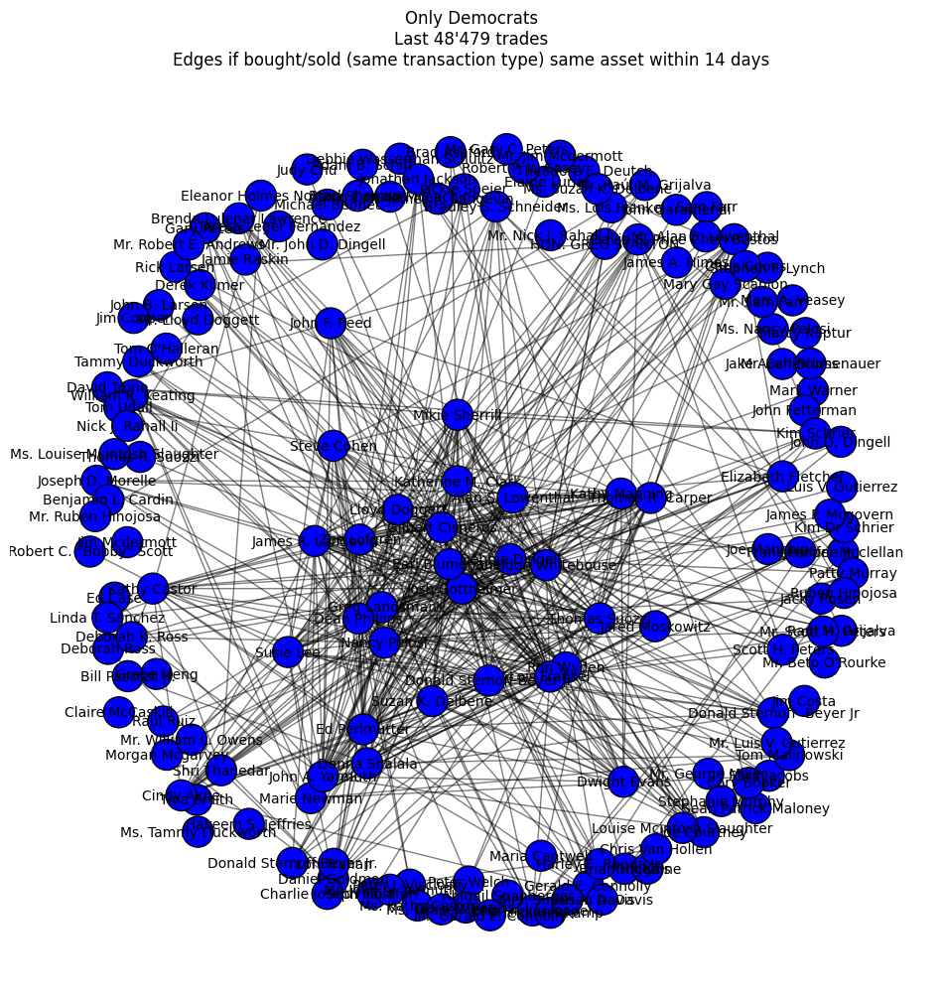

In [43]:
# Create a graph
G = nx.Graph()

# Map members to their parties (D = democrats, R = Republicans)
party_colors = {"D": "blue", "R": "red"}
party_map = {row["Representative"]: row["Party"] for _, row in df.iterrows()}

# Filter the DataFrame to only include Republicans
democrat_reps = [rep for rep, party in party_map.items() if party == "D"]
rep_democrat = df[df["Representative"].isin(democrat_reps)]

# Add nodes for each unique representative with party color
for rep in rep_democrat["Representative"].unique():
    G.add_node(
        rep, color=party_colors.get(party_map[rep], "gray")
    )  # Default to gray if party unknown

# Create edges for representatives who made trades (same transaction type) on same asset within certain time period
for ticker in rep_democrat["Ticker"].unique():
    # Filter rows for the current ticker
    ticker_trades = rep_democrat[rep_democrat["Ticker"] == ticker]

    # Loop through each pair of representatives who traded this stock
    for i in range(len(ticker_trades)):
        for j in range(i + 1, len(ticker_trades)):
            rep1 = ticker_trades.iloc[i]["Representative"]
            rep2 = ticker_trades.iloc[j]["Representative"]
            date1 = ticker_trades.iloc[i]["TransactionDate"]
            date2 = ticker_trades.iloc[j]["TransactionDate"]
            trans_type1 = ticker_trades.iloc[i]["Transaction"]
            trans_type2 = ticker_trades.iloc[j]["Transaction"]

            # Check if the trades are within the specified period, avoid self-loops, and match transaction types
            if rep1 != rep2 and abs((date1 - date2).days) <= 14 and trans_type1 == trans_type2:
                G.add_edge(rep1, rep2, stock=ticker)

# Export the graph to a GML file
folder = "data/internal/networks"
os.makedirs(folder, exist_ok=True)
filename = "democrat_members_14days.gml"
nx.write_gml(G, f"../{folder}/{filename}")
print(f"GML file saved as {folder}/{filename}")

# Draw the graph
plt.figure(figsize=(12, 12))

# Use spring layout for better visualization
pos = nx.spring_layout(G, seed=42, k=1.5)

# Get node colors based on party
node_colors = [data["color"] for _, data in G.nodes(data=True)]

# Draw nodes and edges with color based on party
nx.draw_networkx_nodes(G, pos, node_size=500, node_color=node_colors, edgecolors="black")
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=10, font_family="sans-serif")

# Display the plot
plt.title(
    "Only Democrats\nLast 48'479 trades\nEdges if bought/sold (same transaction type) same asset within 14 days"
)
plt.axis("off")
plt.show()

##### 7 days

GML file saved as data/internal/networks/republican_members_7days.gml


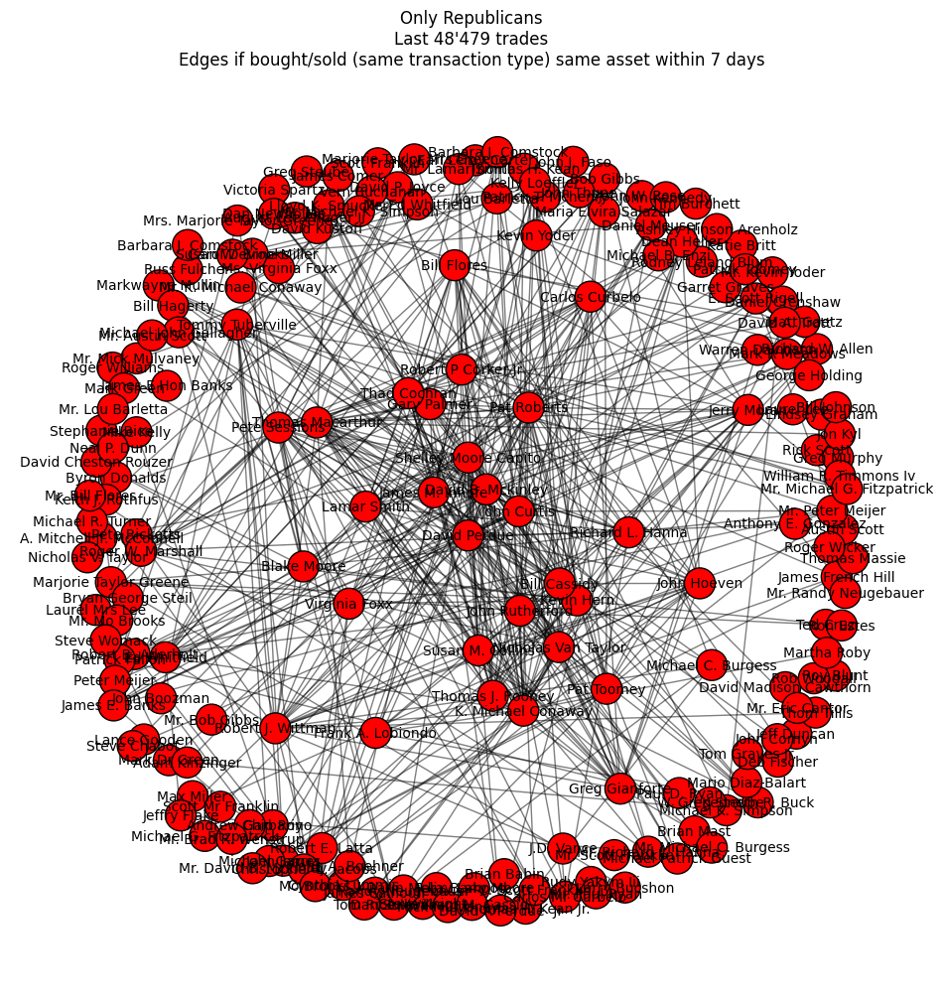

In [44]:
# Create a graph
G = nx.Graph()

# Map members to their parties (D = democrats, R = Republicans)
party_colors = {"D": "blue", "R": "red"}
party_map = {row["Representative"]: row["Party"] for _, row in df.iterrows()}

# Filter the DataFrame to only include Republicans
republican_reps = [rep for rep, party in party_map.items() if party == "R"]
df_republican = df[df["Representative"].isin(republican_reps)]

# Add nodes for each unique representative with party color
for rep in df_republican["Representative"].unique():
    G.add_node(
        rep, color=party_colors.get(party_map[rep], "gray")
    )  # Default to gray if party unknown

# Create edges for representatives who made trades (same transaction type) on same asset within certain time period
for ticker in df_republican["Ticker"].unique():
    # Filter rows for the current ticker
    ticker_trades = df_republican[df_republican["Ticker"] == ticker]

    # Loop through each pair of representatives who traded this stock
    for i in range(len(ticker_trades)):
        for j in range(i + 1, len(ticker_trades)):
            rep1 = ticker_trades.iloc[i]["Representative"]
            rep2 = ticker_trades.iloc[j]["Representative"]
            date1 = ticker_trades.iloc[i]["TransactionDate"]
            date2 = ticker_trades.iloc[j]["TransactionDate"]
            trans_type1 = ticker_trades.iloc[i]["Transaction"]
            trans_type2 = ticker_trades.iloc[j]["Transaction"]

            # Check if the trades are within the specified period, avoid self-loops, and match transaction types
            if rep1 != rep2 and abs((date1 - date2).days) <= 7 and trans_type1 == trans_type2:
                G.add_edge(rep1, rep2, stock=ticker)

# Export the graph to a GML file
folder = "data/internal/networks"
os.makedirs(folder, exist_ok=True)
filename = "republican_members_7days.gml"
nx.write_gml(G, f"../{folder}/{filename}")
print(f"GML file saved as {folder}/{filename}")

# Draw the graph
plt.figure(figsize=(12, 12))

# Use spring layout for better visualization
pos = nx.spring_layout(G, seed=42, k=1.5)

# Get node colors based on party
node_colors = [data["color"] for _, data in G.nodes(data=True)]

# Draw nodes and edges with color based on party
nx.draw_networkx_nodes(G, pos, node_size=500, node_color=node_colors, edgecolors="black")
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=10, font_family="sans-serif")

# Display the plot
plt.title(
    "Only Republicans\nLast 48'479 trades\nEdges if bought/sold (same transaction type) same asset within 7 days"
)
plt.axis("off")
plt.show()

GML file saved as data/internal/networks/democrat_members_7days.gml


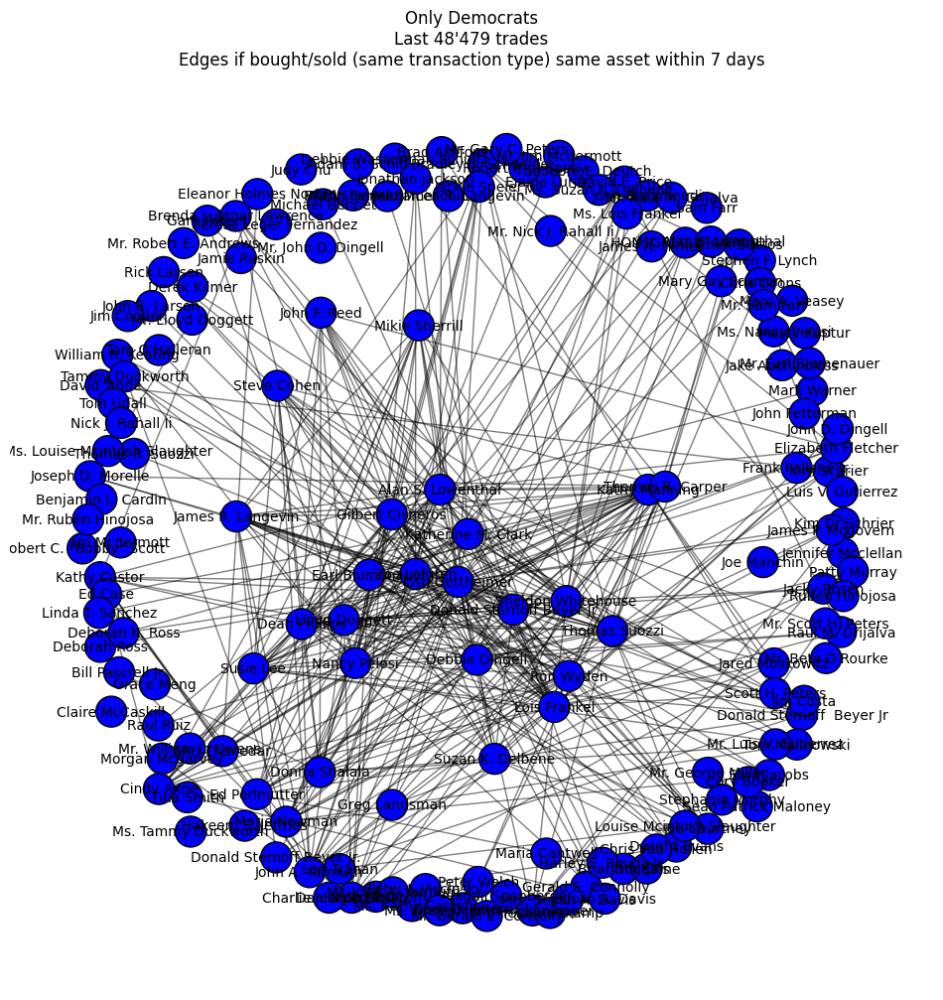

In [45]:
# Create a graph
G = nx.Graph()

# Map members to their parties (D = democrats, R = Republicans)
party_colors = {"D": "blue", "R": "red"}
party_map = {row["Representative"]: row["Party"] for _, row in df.iterrows()}

# Filter the DataFrame to only include Republicans
democrat_reps = [rep for rep, party in party_map.items() if party == "D"]
rep_democrat = df[df["Representative"].isin(democrat_reps)]

# Add nodes for each unique representative with party color
for rep in rep_democrat["Representative"].unique():
    G.add_node(
        rep, color=party_colors.get(party_map[rep], "gray")
    )  # Default to gray if party unknown

# Create edges for representatives who made trades (same transaction type) on same asset within certain time period
for ticker in rep_democrat["Ticker"].unique():
    # Filter rows for the current ticker
    ticker_trades = rep_democrat[rep_democrat["Ticker"] == ticker]

    # Loop through each pair of representatives who traded this stock
    for i in range(len(ticker_trades)):
        for j in range(i + 1, len(ticker_trades)):
            rep1 = ticker_trades.iloc[i]["Representative"]
            rep2 = ticker_trades.iloc[j]["Representative"]
            date1 = ticker_trades.iloc[i]["TransactionDate"]
            date2 = ticker_trades.iloc[j]["TransactionDate"]
            trans_type1 = ticker_trades.iloc[i]["Transaction"]
            trans_type2 = ticker_trades.iloc[j]["Transaction"]

            # Check if the trades are within the specified period, avoid self-loops, and match transaction types
            if rep1 != rep2 and abs((date1 - date2).days) <= 7 and trans_type1 == trans_type2:
                G.add_edge(rep1, rep2, stock=ticker)

# Export the graph to a GML file
folder = "data/internal/networks"
os.makedirs(folder, exist_ok=True)
filename = "democrat_members_7days.gml"
nx.write_gml(G, f"../{folder}/{filename}")
print(f"GML file saved as {folder}/{filename}")

# Draw the graph
plt.figure(figsize=(12, 12))

# Use spring layout for better visualization
pos = nx.spring_layout(G, seed=42, k=1.5)

# Get node colors based on party
node_colors = [data["color"] for _, data in G.nodes(data=True)]

# Draw nodes and edges with color based on party
nx.draw_networkx_nodes(G, pos, node_size=500, node_color=node_colors, edgecolors="black")
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=10, font_family="sans-serif")

# Display the plot
plt.title(
    "Only Democrats\nLast 48'479 trades\nEdges if bought/sold (same transaction type) same asset within 7 days"
)
plt.axis("off")
plt.show()

##### 1 day

GML file saved as data/internal/networks/republican_members_1day.gml


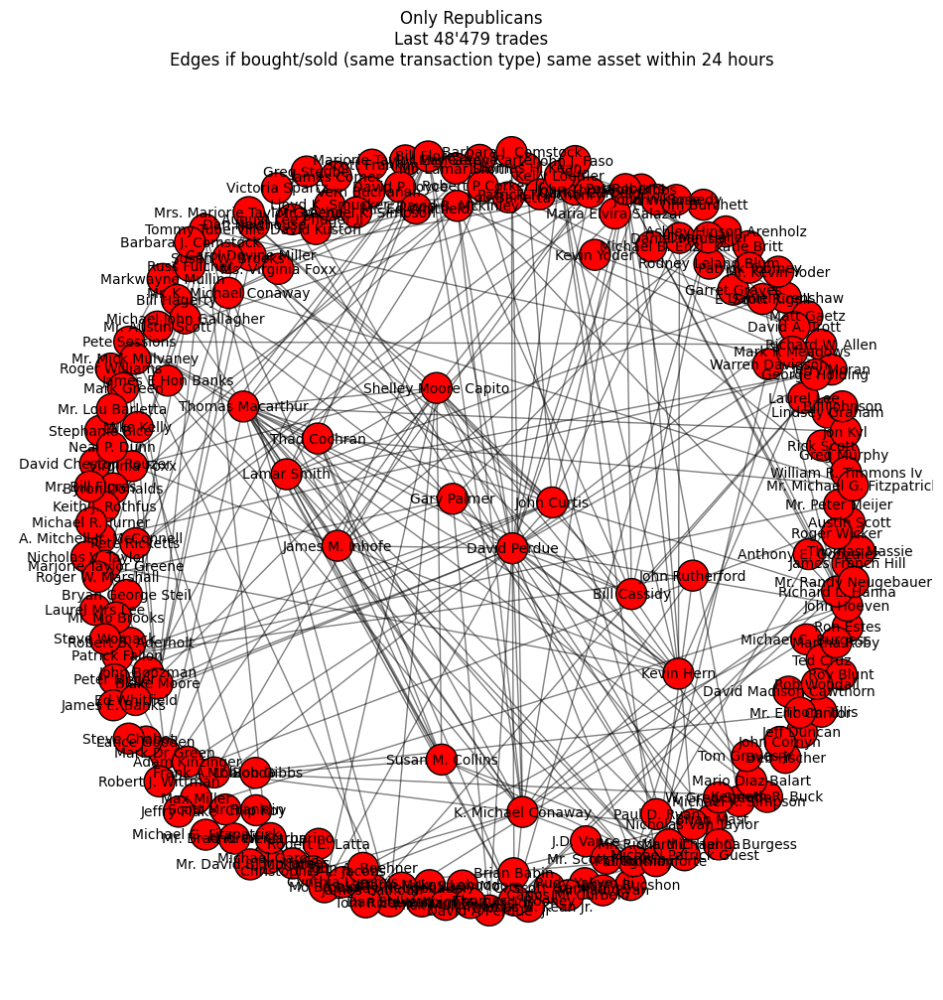

In [46]:
# Create a graph
G = nx.Graph()

# Map members to their parties (D = democrats, R = Republicans)
party_colors = {"D": "blue", "R": "red"}
party_map = {row["Representative"]: row["Party"] for _, row in df.iterrows()}

# Filter the DataFrame to only include Republicans
republican_reps = [rep for rep, party in party_map.items() if party == "R"]
df_republican = df[df["Representative"].isin(republican_reps)]

# Add nodes for each unique representative with party color
for rep in df_republican["Representative"].unique():
    G.add_node(
        rep, color=party_colors.get(party_map[rep], "gray")
    )  # Default to gray if party unknown

# Create edges for representatives who made trades (same transaction type) on same asset within certain time period
for ticker in df_republican["Ticker"].unique():
    # Filter rows for the current ticker
    ticker_trades = df_republican[df_republican["Ticker"] == ticker]

    # Loop through each pair of representatives who traded this stock
    for i in range(len(ticker_trades)):
        for j in range(i + 1, len(ticker_trades)):
            rep1 = ticker_trades.iloc[i]["Representative"]
            rep2 = ticker_trades.iloc[j]["Representative"]
            date1 = ticker_trades.iloc[i]["TransactionDate"]
            date2 = ticker_trades.iloc[j]["TransactionDate"]
            trans_type1 = ticker_trades.iloc[i]["Transaction"]
            trans_type2 = ticker_trades.iloc[j]["Transaction"]

            # Check if the trades are within the specified period, avoid self-loops, and match transaction types
            if rep1 != rep2 and abs((date1 - date2).days) <= 1 and trans_type1 == trans_type2:
                G.add_edge(rep1, rep2, stock=ticker)

# Export the graph to a GML file
folder = "data/internal/networks"
os.makedirs(folder, exist_ok=True)
filename = "republican_members_1day.gml"
nx.write_gml(G, f"../{folder}/{filename}")
print(f"GML file saved as {folder}/{filename}")

# Draw the graph
plt.figure(figsize=(12, 12))

# Use spring layout for better visualization
pos = nx.spring_layout(G, seed=42, k=1.5)

# Get node colors based on party
node_colors = [data["color"] for _, data in G.nodes(data=True)]

# Draw nodes and edges with color based on party
nx.draw_networkx_nodes(G, pos, node_size=500, node_color=node_colors, edgecolors="black")
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=10, font_family="sans-serif")

# Display the plot
plt.title(
    "Only Republicans\nLast 48'479 trades\nEdges if bought/sold (same transaction type) same asset within 24 hours"
)
plt.axis("off")
plt.show()

GML file saved as data/internal/networks/democrat_members_1day.gml


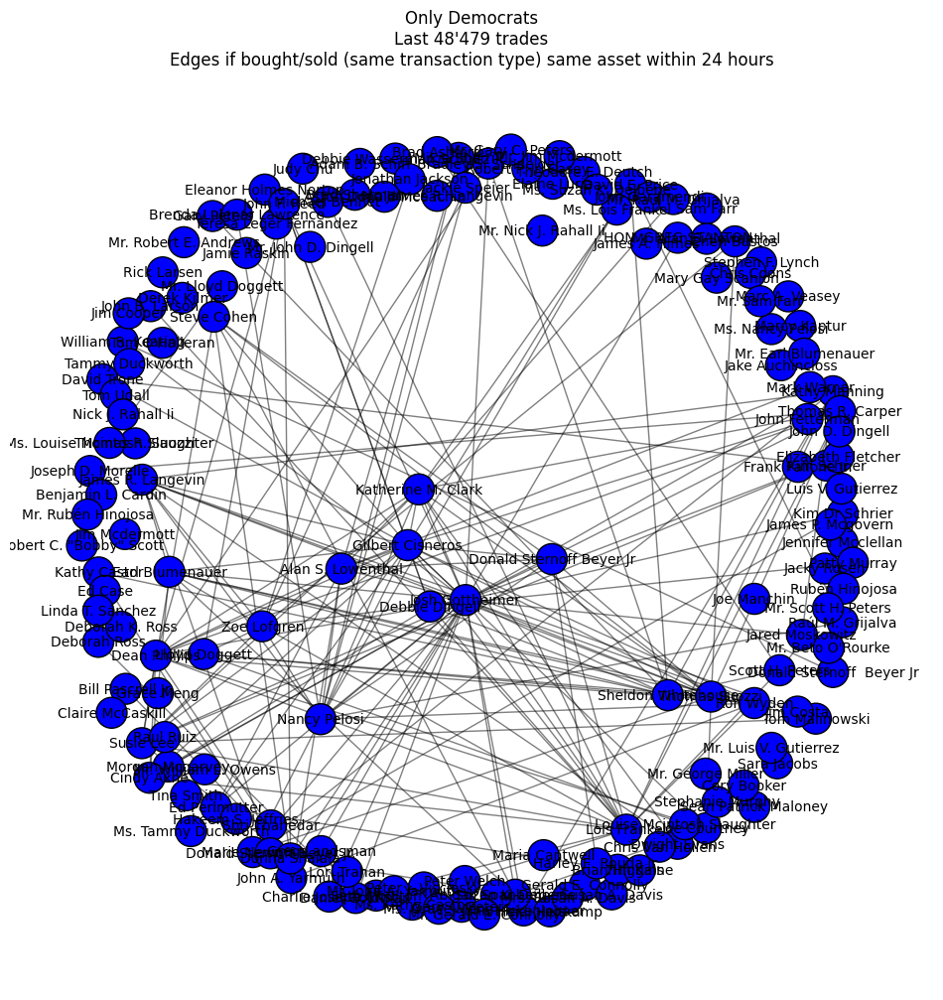

In [47]:
# Create a graph
G = nx.Graph()

# Map members to their parties (D = democrats, R = Republicans)
party_colors = {"D": "blue", "R": "red"}
party_map = {row["Representative"]: row["Party"] for _, row in df.iterrows()}

# Filter the DataFrame to only include Republicans
democrat_reps = [rep for rep, party in party_map.items() if party == "D"]
rep_democrat = df[df["Representative"].isin(democrat_reps)]

# Add nodes for each unique representative with party color
for rep in rep_democrat["Representative"].unique():
    G.add_node(
        rep, color=party_colors.get(party_map[rep], "gray")
    )  # Default to gray if party unknown

# Create edges for representatives who made trades (same transaction type) on same asset within certain time period
for ticker in rep_democrat["Ticker"].unique():
    # Filter rows for the current ticker
    ticker_trades = rep_democrat[rep_democrat["Ticker"] == ticker]

    # Loop through each pair of representatives who traded this stock
    for i in range(len(ticker_trades)):
        for j in range(i + 1, len(ticker_trades)):
            rep1 = ticker_trades.iloc[i]["Representative"]
            rep2 = ticker_trades.iloc[j]["Representative"]
            date1 = ticker_trades.iloc[i]["TransactionDate"]
            date2 = ticker_trades.iloc[j]["TransactionDate"]
            trans_type1 = ticker_trades.iloc[i]["Transaction"]
            trans_type2 = ticker_trades.iloc[j]["Transaction"]

            # Check if the trades are within the specified period, avoid self-loops, and match transaction types
            if rep1 != rep2 and abs((date1 - date2).days) <= 1 and trans_type1 == trans_type2:
                G.add_edge(rep1, rep2, stock=ticker)

# Export the graph to a GML file
folder = "data/internal/networks"
os.makedirs(folder, exist_ok=True)
filename = "democrat_members_1day.gml"
nx.write_gml(G, f"../{folder}/{filename}")
print(f"GML file saved as {folder}/{filename}")

# Draw the graph
plt.figure(figsize=(12, 12))

# Use spring layout for better visualization
pos = nx.spring_layout(G, seed=42, k=1.5)

# Get node colors based on party
node_colors = [data["color"] for _, data in G.nodes(data=True)]

# Draw nodes and edges with color based on party
nx.draw_networkx_nodes(G, pos, node_size=500, node_color=node_colors, edgecolors="black")
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=10, font_family="sans-serif")

# Display the plot
plt.title(
    "Only Democrats\nLast 48'479 trades\nEdges if bought/sold (same transaction type) same asset within 24 hours"
)
plt.axis("off")
plt.show()

#### Senate vs Representatives

##### 14 days

GML file saved as data/internal/networks/senators_14days.gml


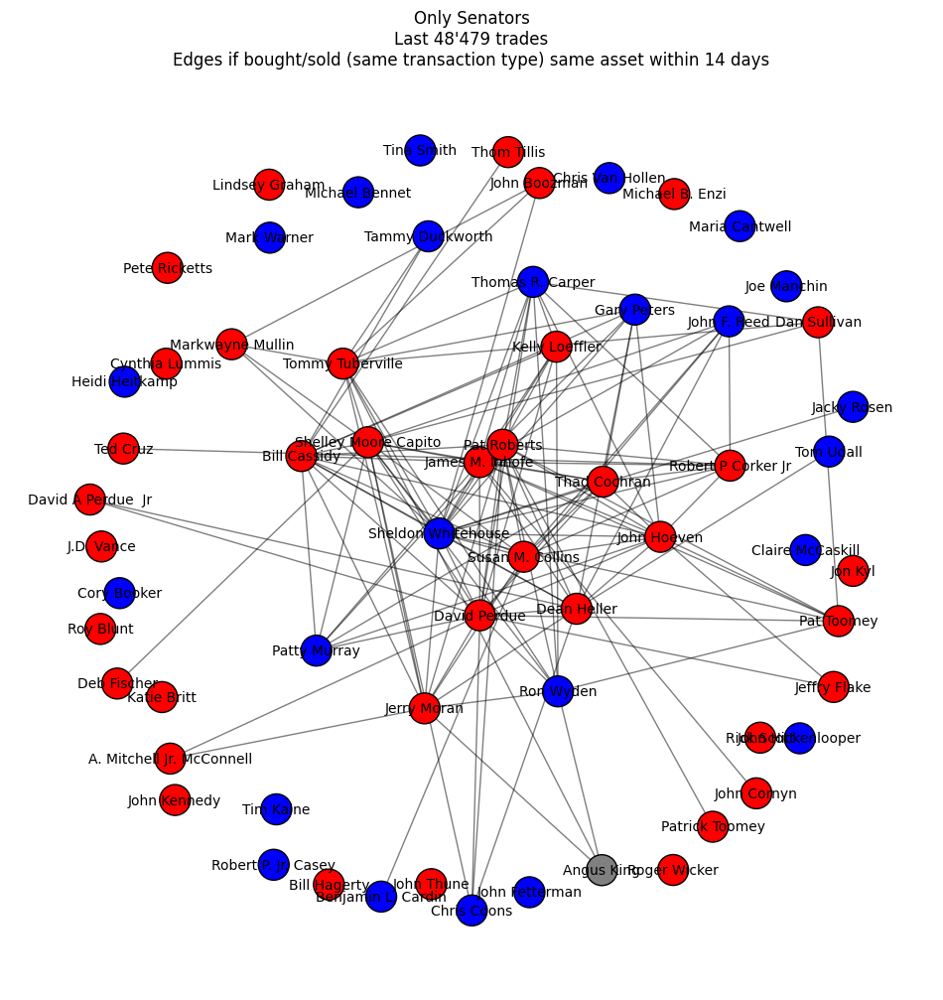

In [48]:
# Create a graph
G = nx.Graph()

# Map members to their parties (D = democrats, R = Republicans)
party_colors = {"D": "blue", "R": "red"}
party_map = {row["Representative"]: row["Party"] for _, row in df.iterrows()}

df_senators = df[df["House"] == "Senate"]

# Add nodes for each unique representative with party color
for rep in df_senators["Representative"].unique():
    G.add_node(
        rep, color=party_colors.get(party_map[rep], "gray")
    )  # Default to gray if party unknown

# Create edges for representatives who made trades (same transaction type) on same asset within certain time period
for ticker in df_senators["Ticker"].unique():
    # Filter rows for the current ticker
    ticker_trades = df_senators[df_senators["Ticker"] == ticker]

    # Loop through each pair of representatives who traded this stock
    for i in range(len(ticker_trades)):
        for j in range(i + 1, len(ticker_trades)):
            rep1 = ticker_trades.iloc[i]["Representative"]
            rep2 = ticker_trades.iloc[j]["Representative"]
            date1 = ticker_trades.iloc[i]["TransactionDate"]
            date2 = ticker_trades.iloc[j]["TransactionDate"]
            trans_type1 = ticker_trades.iloc[i]["Transaction"]
            trans_type2 = ticker_trades.iloc[j]["Transaction"]

            # Check if the trades are within the specified period, avoid self-loops,     and match transaction types
            if rep1 != rep2 and abs((date1 - date2).days) <= 14 and trans_type1 == trans_type2:
                G.add_edge(rep1, rep2, stock=ticker)

# Export the graph to a GML file
folder = "data/internal/networks"
os.makedirs(folder, exist_ok=True)
filename = "senators_14days.gml"
nx.write_gml(G, f"../{folder}/{filename}")
print(f"GML file saved as {folder}/{filename}")

# Draw the graph
plt.figure(figsize=(12, 12))

# Use spring layout for better visualization
pos = nx.spring_layout(G, seed=42, k=1.5)

# Get node colors based on party
node_colors = [data["color"] for _, data in G.nodes(data=True)]

# Draw nodes and edges with color based on party
nx.draw_networkx_nodes(G, pos, node_size=500, node_color=node_colors, edgecolors="black")
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=10, font_family="sans-serif")

# Display the plot
plt.title(
    "Only Senators\nLast 48'479 trades\nEdges if bought/sold (same transaction type) same asset within 14 days"
)
plt.axis("off")
plt.show()

GML file saved as data/internal/networks/representatives_14days.gml


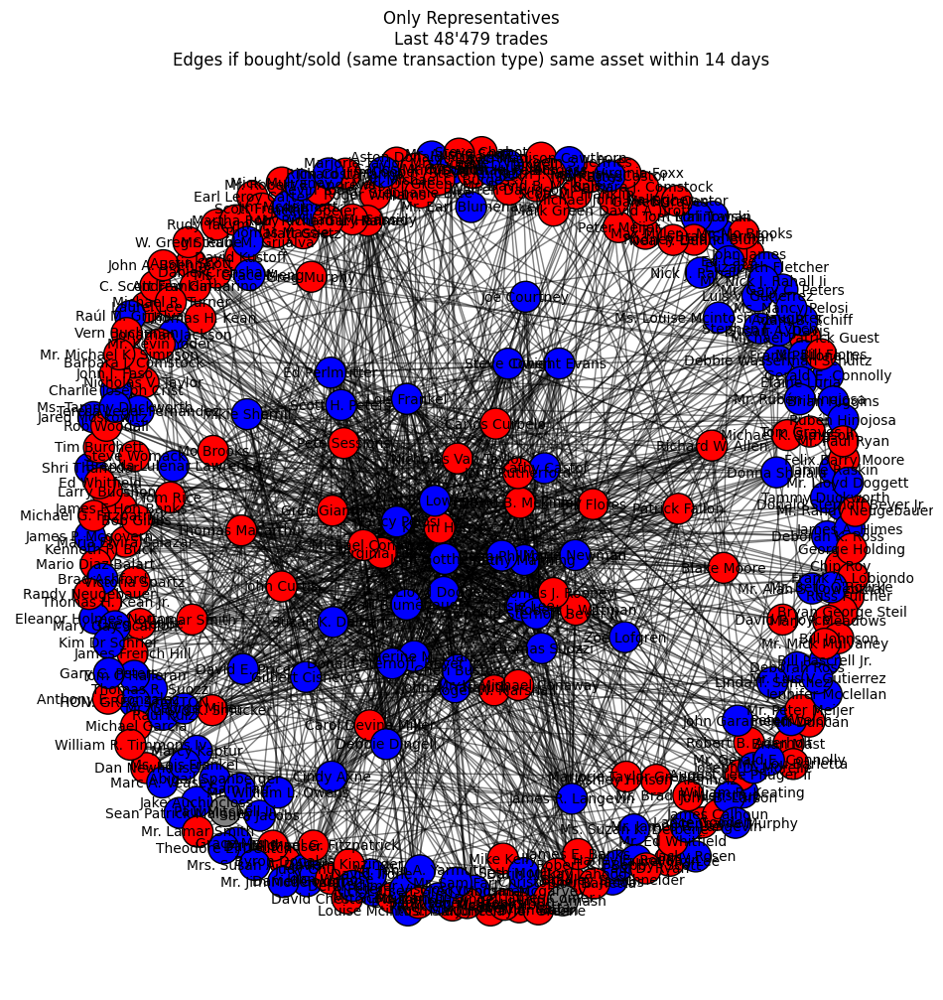

In [49]:
# Create a graph
G = nx.Graph()

# Map members to their parties (D = democrats, R = Republicans)
party_colors = {"D": "blue", "R": "red"}
party_map = {row["Representative"]: row["Party"] for _, row in df.iterrows()}

df_representatives = df[df["House"] == "Representatives"]

# Add nodes for each unique representative with party color
for rep in df_representatives["Representative"].unique():
    G.add_node(
        rep, color=party_colors.get(party_map[rep], "gray")
    )  # Default to gray if party unknown

# Create edges for representatives who made trades (same transaction type) on same asset within certain time period
for ticker in df_representatives["Ticker"].unique():
    # Filter rows for the current ticker
    ticker_trades = df_representatives[df_representatives["Ticker"] == ticker]

    # Loop through each pair of representatives who traded this stock
    for i in range(len(ticker_trades)):
        for j in range(i + 1, len(ticker_trades)):
            rep1 = ticker_trades.iloc[i]["Representative"]
            rep2 = ticker_trades.iloc[j]["Representative"]
            date1 = ticker_trades.iloc[i]["TransactionDate"]
            date2 = ticker_trades.iloc[j]["TransactionDate"]
            trans_type1 = ticker_trades.iloc[i]["Transaction"]
            trans_type2 = ticker_trades.iloc[j]["Transaction"]

            # Check if the trades are within the specified period, avoid self-loops, and match transaction types
            if rep1 != rep2 and abs((date1 - date2).days) <= 14 and trans_type1 == trans_type2:
                G.add_edge(rep1, rep2, stock=ticker)

# Export the graph to a GML file
folder = "data/internal/networks"
os.makedirs(folder, exist_ok=True)
filename = "representatives_14days.gml"
nx.write_gml(G, f"../{folder}/{filename}")
print(f"GML file saved as {folder}/{filename}")

# Draw the graph
plt.figure(figsize=(12, 12))

# Use spring layout for better visualization
pos = nx.spring_layout(G, seed=42, k=1.5)

# Get node colors based on party
node_colors = [data["color"] for _, data in G.nodes(data=True)]

# Draw nodes and edges with color based on party
nx.draw_networkx_nodes(G, pos, node_size=500, node_color=node_colors, edgecolors="black")
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=10, font_family="sans-serif")

# Display the plot
plt.title(
    "Only Representatives\nLast 48'479 trades\nEdges if bought/sold (same transaction type) same asset within 14 days"
)
plt.axis("off")
plt.show()

##### 7 days

GML file saved as data/internal/networks/senators_7days.gml


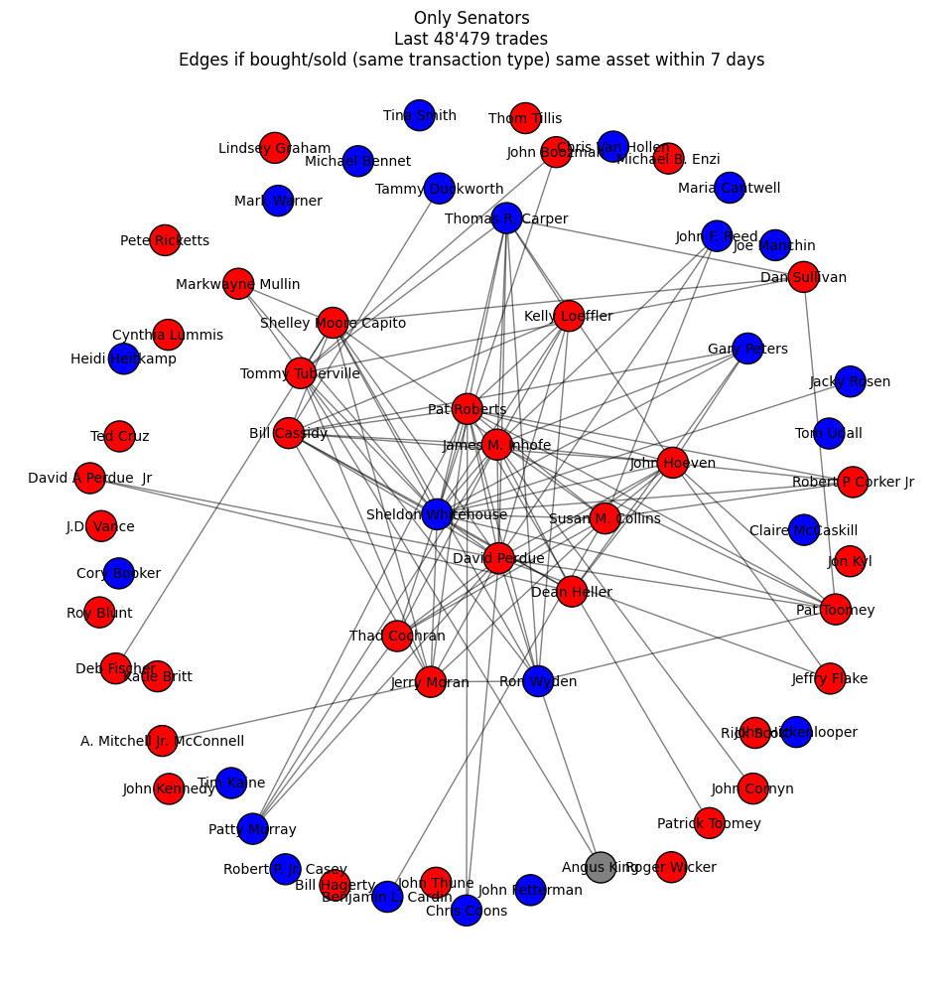

In [50]:
# Create a graph
G = nx.Graph()

# Map members to their parties (D = democrats, R = Republicans)
party_colors = {"D": "blue", "R": "red"}
party_map = {row["Representative"]: row["Party"] for _, row in df.iterrows()}

df_senators = df[df["House"] == "Senate"]

# Add nodes for each unique representative with party color
for rep in df_senators["Representative"].unique():
    G.add_node(
        rep, color=party_colors.get(party_map[rep], "gray")
    )  # Default to gray if party unknown

# Create edges for representatives who made trades (same transaction type) on same asset within certain time period
for ticker in df_senators["Ticker"].unique():
    # Filter rows for the current ticker
    ticker_trades = df_senators[df_senators["Ticker"] == ticker]

    # Loop through each pair of representatives who traded this stock
    for i in range(len(ticker_trades)):
        for j in range(i + 1, len(ticker_trades)):
            rep1 = ticker_trades.iloc[i]["Representative"]
            rep2 = ticker_trades.iloc[j]["Representative"]
            date1 = ticker_trades.iloc[i]["TransactionDate"]
            date2 = ticker_trades.iloc[j]["TransactionDate"]
            trans_type1 = ticker_trades.iloc[i]["Transaction"]
            trans_type2 = ticker_trades.iloc[j]["Transaction"]

            # Check if the trades are within the specified period, avoid self-loops, and match transaction types
            if rep1 != rep2 and abs((date1 - date2).days) <= 7 and trans_type1 == trans_type2:
                G.add_edge(rep1, rep2, stock=ticker)

# Export the graph to a GML file
folder = "data/internal/networks"
os.makedirs(folder, exist_ok=True)
filename = "senators_7days.gml"
nx.write_gml(G, f"../{folder}/{filename}")
print(f"GML file saved as {folder}/{filename}")

# Draw the graph
plt.figure(figsize=(12, 12))

# Use spring layout for better visualization
pos = nx.spring_layout(G, seed=42, k=1.5)

# Get node colors based on party
node_colors = [data["color"] for _, data in G.nodes(data=True)]

# Draw nodes and edges with color based on party
nx.draw_networkx_nodes(G, pos, node_size=500, node_color=node_colors, edgecolors="black")
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=10, font_family="sans-serif")

# Display the plot
plt.title(
    "Only Senators\nLast 48'479 trades\nEdges if bought/sold (same transaction type) same asset within 7 days"
)
plt.axis("off")
plt.show()

GML file saved as data/internal/networks/representatives_7days.gml


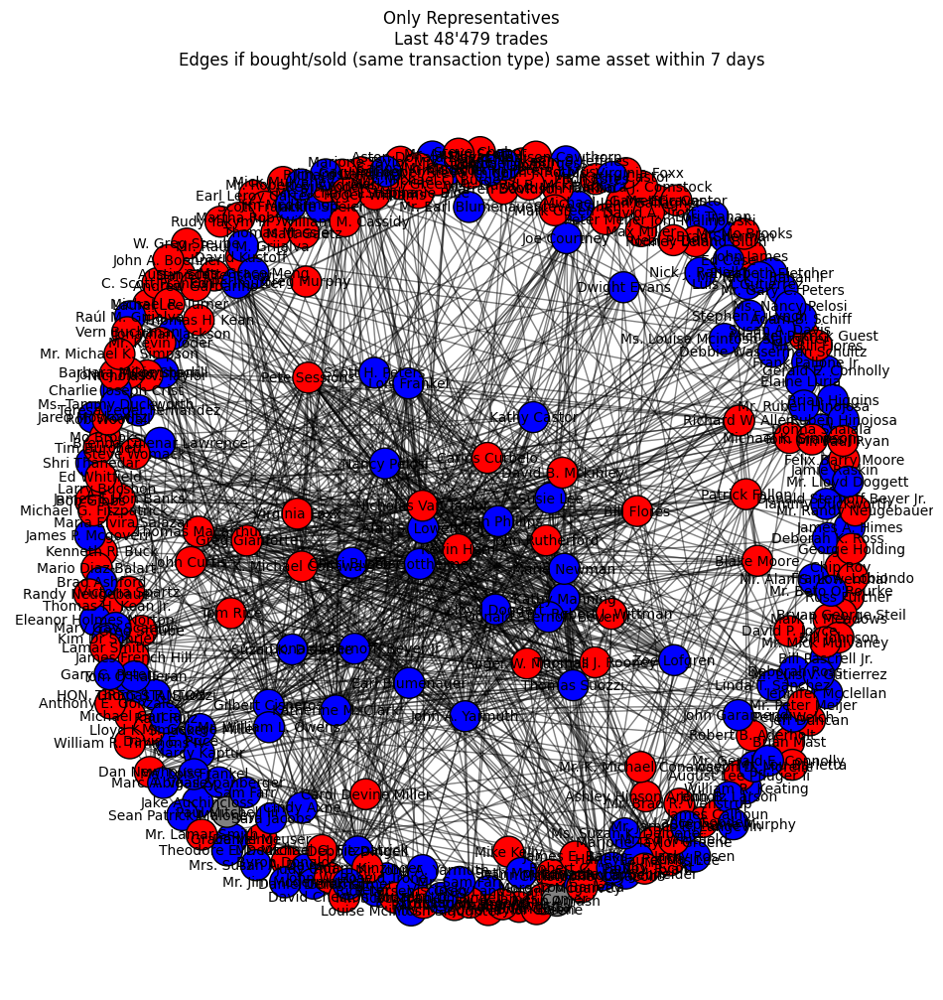

In [51]:
# Create a graph
G = nx.Graph()

# Map members to their parties (D = democrats, R = Republicans)
party_colors = {"D": "blue", "R": "red"}
party_map = {row["Representative"]: row["Party"] for _, row in df.iterrows()}

df_representatives = df[df["House"] == "Representatives"]

# Add nodes for each unique representative with party color
for rep in df_representatives["Representative"].unique():
    G.add_node(
        rep, color=party_colors.get(party_map[rep], "gray")
    )  # Default to gray if party unknown

# Create edges for representatives who made trades (same transaction type) on same asset within certain time period
for ticker in df_representatives["Ticker"].unique():
    # Filter rows for the current ticker
    ticker_trades = df_representatives[df_representatives["Ticker"] == ticker]

    # Loop through each pair of representatives who traded this stock
    for i in range(len(ticker_trades)):
        for j in range(i + 1, len(ticker_trades)):
            rep1 = ticker_trades.iloc[i]["Representative"]
            rep2 = ticker_trades.iloc[j]["Representative"]
            date1 = ticker_trades.iloc[i]["TransactionDate"]
            date2 = ticker_trades.iloc[j]["TransactionDate"]
            trans_type1 = ticker_trades.iloc[i]["Transaction"]
            trans_type2 = ticker_trades.iloc[j]["Transaction"]

            # Check if the trades are within the specified period, avoid self-loops, and match transaction types
            if rep1 != rep2 and abs((date1 - date2).days) <= 7 and trans_type1 == trans_type2:
                G.add_edge(rep1, rep2, stock=ticker)

# Export the graph to a GML file
folder = "data/internal/networks"
os.makedirs(folder, exist_ok=True)
filename = "representatives_7days.gml"
nx.write_gml(G, f"../{folder}/{filename}")
print(f"GML file saved as {folder}/{filename}")

# Draw the graph
plt.figure(figsize=(12, 12))

# Use spring layout for better visualization
pos = nx.spring_layout(G, seed=42, k=1.5)

# Get node colors based on party
node_colors = [data["color"] for _, data in G.nodes(data=True)]

# Draw nodes and edges with color based on party
nx.draw_networkx_nodes(G, pos, node_size=500, node_color=node_colors, edgecolors="black")
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=10, font_family="sans-serif")

# Display the plot
plt.title(
    "Only Representatives\nLast 48'479 trades\nEdges if bought/sold (same transaction type) same asset within 7 days"
)
plt.axis("off")
plt.show()

##### 1 day

GML file saved as data/internal/networks/senators_1day.gml


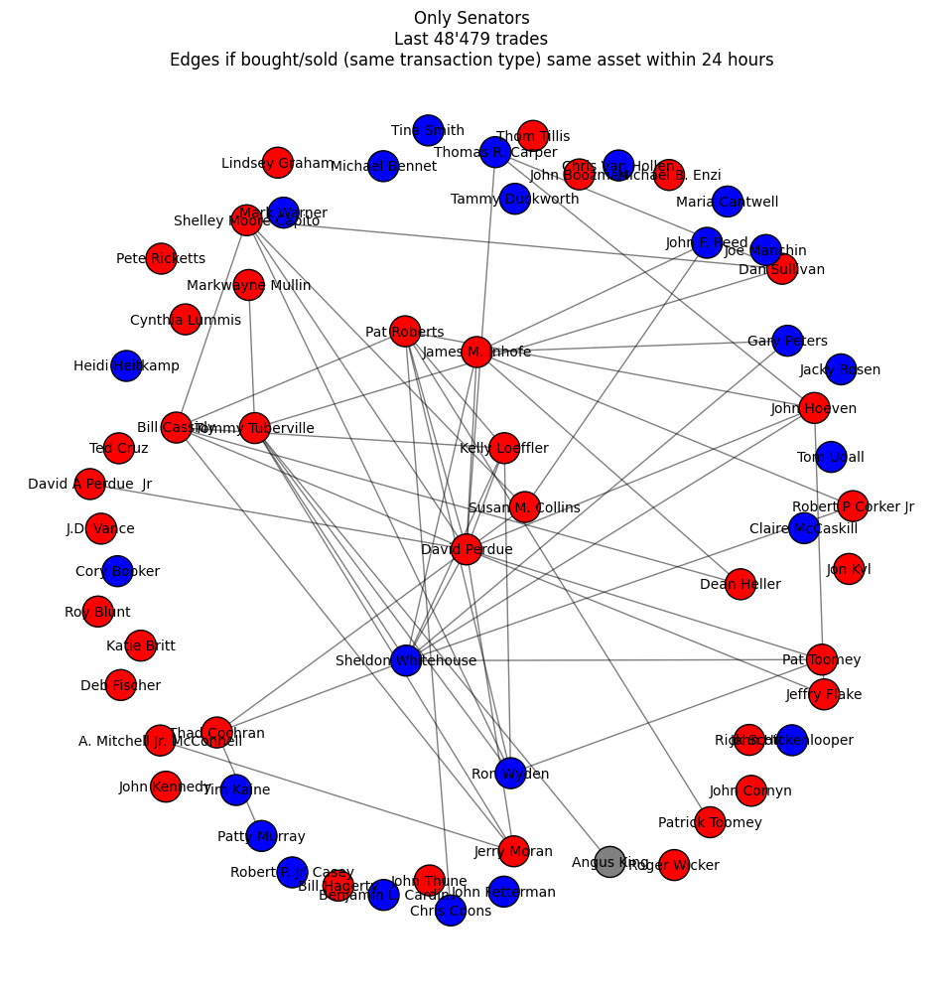

In [52]:
# Create a graph
G = nx.Graph()

# Map members to their parties (D = democrats, R = Republicans)
party_colors = {"D": "blue", "R": "red"}
party_map = {row["Representative"]: row["Party"] for _, row in df.iterrows()}

df_senators = df[df["House"] == "Senate"]

# Add nodes for each unique representative with party color
for rep in df_senators["Representative"].unique():
    G.add_node(
        rep, color=party_colors.get(party_map[rep], "gray")
    )  # Default to gray if party unknown

# Create edges for representatives who made trades (same transaction type) on same asset within certain time period
for ticker in df_senators["Ticker"].unique():
    # Filter rows for the current ticker
    ticker_trades = df_senators[df_senators["Ticker"] == ticker]

    # Loop through each pair of representatives who traded this stock
    for i in range(len(ticker_trades)):
        for j in range(i + 1, len(ticker_trades)):
            rep1 = ticker_trades.iloc[i]["Representative"]
            rep2 = ticker_trades.iloc[j]["Representative"]
            date1 = ticker_trades.iloc[i]["TransactionDate"]
            date2 = ticker_trades.iloc[j]["TransactionDate"]
            trans_type1 = ticker_trades.iloc[i]["Transaction"]
            trans_type2 = ticker_trades.iloc[j]["Transaction"]

            # Check if the trades are within the specified period, avoid self-loops, and match transaction types
            if rep1 != rep2 and abs((date1 - date2).days) <= 1 and trans_type1 == trans_type2:
                G.add_edge(rep1, rep2, stock=ticker)

# Export the graph to a GML file
folder = "data/internal/networks"
os.makedirs(folder, exist_ok=True)
filename = "senators_1day.gml"
nx.write_gml(G, f"../{folder}/{filename}")
print(f"GML file saved as {folder}/{filename}")

# Draw the graph
plt.figure(figsize=(12, 12))

# Use spring layout for better visualization
pos = nx.spring_layout(G, seed=42, k=1.5)

# Get node colors based on party
node_colors = [data["color"] for _, data in G.nodes(data=True)]

# Draw nodes and edges with color based on party
nx.draw_networkx_nodes(G, pos, node_size=500, node_color=node_colors, edgecolors="black")
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=10, font_family="sans-serif")

# Display the plot
plt.title(
    "Only Senators\nLast 48'479 trades\nEdges if bought/sold (same transaction type) same asset within 24 hours"
)
plt.axis("off")
plt.show()

GML file saved as data/internal/networks/representatives_1day.gml


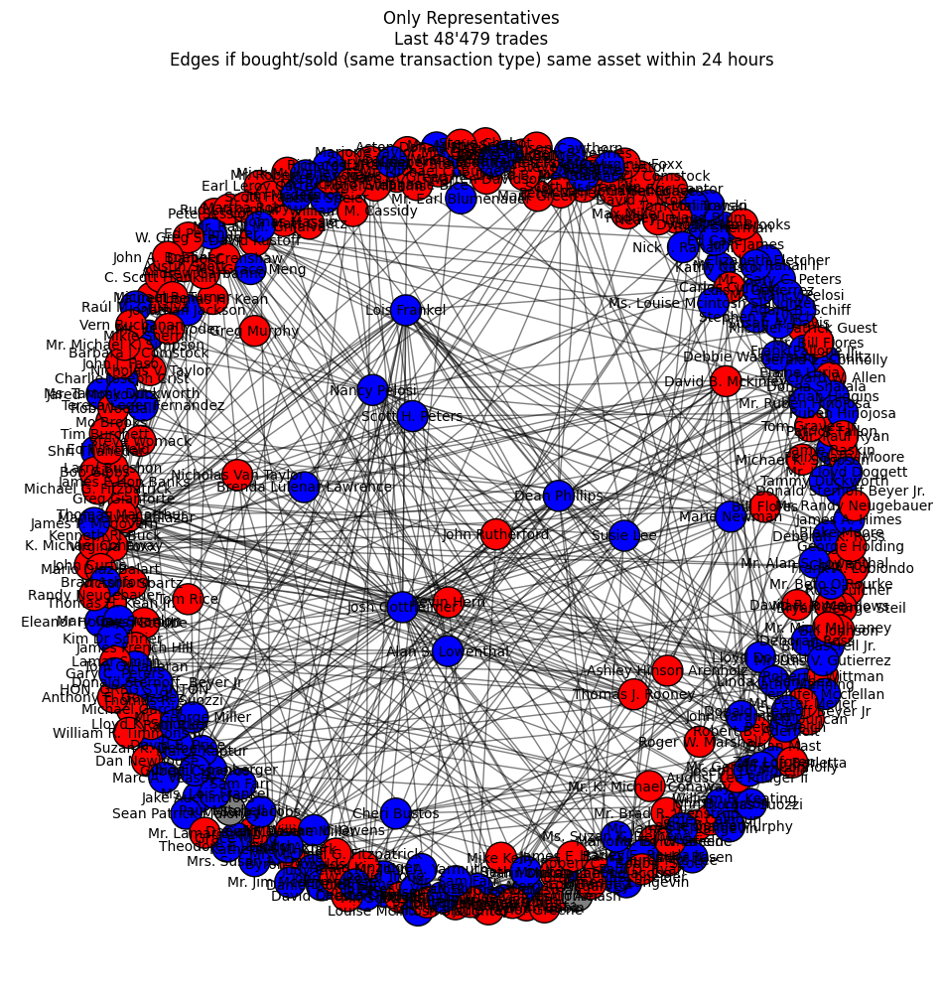

In [53]:
# Create a graph
G = nx.Graph()

# Map members to their parties (D = democrats, R = Republicans)
party_colors = {"D": "blue", "R": "red"}
party_map = {row["Representative"]: row["Party"] for _, row in df.iterrows()}

df_representatives = df[df["House"] == "Representatives"]

# Add nodes for each unique representative with party color
for rep in df_representatives["Representative"].unique():
    G.add_node(
        rep, color=party_colors.get(party_map[rep], "gray")
    )  # Default to gray if party unknown

# Create edges for representatives who made trades (same transaction type) on same asset within certain time period
for ticker in df_representatives["Ticker"].unique():
    # Filter rows for the current ticker
    ticker_trades = df_representatives[df_representatives["Ticker"] == ticker]

    # Loop through each pair of representatives who traded this stock
    for i in range(len(ticker_trades)):
        for j in range(i + 1, len(ticker_trades)):
            rep1 = ticker_trades.iloc[i]["Representative"]
            rep2 = ticker_trades.iloc[j]["Representative"]
            date1 = ticker_trades.iloc[i]["TransactionDate"]
            date2 = ticker_trades.iloc[j]["TransactionDate"]
            trans_type1 = ticker_trades.iloc[i]["Transaction"]
            trans_type2 = ticker_trades.iloc[j]["Transaction"]

            # Check if the trades are within the specified period, avoid self-loops, and match transaction types
            if rep1 != rep2 and abs((date1 - date2).days) <= 1 and trans_type1 == trans_type2:
                G.add_edge(rep1, rep2, stock=ticker)

# Export the graph to a GML file
folder = "data/internal/networks"
os.makedirs(folder, exist_ok=True)
filename = "representatives_1day.gml"
nx.write_gml(G, f"../{folder}/{filename}")
print(f"GML file saved as {folder}/{filename}")

# Draw the graph
plt.figure(figsize=(12, 12))

# Use spring layout for better visualization
pos = nx.spring_layout(G, seed=42, k=1.5)

# Get node colors based on party
node_colors = [data["color"] for _, data in G.nodes(data=True)]

# Draw nodes and edges with color based on party
nx.draw_networkx_nodes(G, pos, node_size=500, node_color=node_colors, edgecolors="black")
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=10, font_family="sans-serif")

# Display the plot
plt.title(
    "Only Representatives\nLast 48'479 trades\nEdges if bought/sold (same transaction type) same asset within 24 hours"
)
plt.axis("off")
plt.show()